In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
np.set_printoptions(threshold=np.inf)

from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression, SGDRegressor, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, GridSearchCV, learning_curve, KFold, RandomizedSearchCV, cross_validate
from sklearn.metrics import mean_squared_error, r2_score
from prettytable import PrettyTable
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from yellowbrick.datasets import load_occupancy
from yellowbrick.model_selection import FeatureImportances

import geopandas as gpd
import geoplot

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [2]:
car_data = pd.read_csv("car-assignments.csv")
car_data = car_data.astype({'CarID': 'float', 'CurrentEmploymentType':'category', 'CurrentEmploymentTitle':'category'})
car_data.info()
car_data.head(8)
car_data.to_pickle('car_df.pkl')
car_data.to_csv('car_df.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   LastName                44 non-null     object  
 1   FirstName               44 non-null     object  
 2   CarID                   35 non-null     float64 
 3   CurrentEmploymentType   44 non-null     category
 4   CurrentEmploymentTitle  44 non-null     category
dtypes: category(2), float64(1), object(2)
memory usage: 2.2+ KB


In [3]:
credit_data = pd.read_csv("cc_data.csv", encoding='cp1252')
credit_data = credit_data.astype({'location':'category'})
credit_data['timestamp'] = pd.to_datetime(credit_data['timestamp'], infer_datetime_format=True)
credit_data.info()
credit_data.head(8)
credit_data.to_pickle('credit_df.pkl')
credit_data.to_csv('credit_df.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1491 entries, 0 to 1490
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  1491 non-null   datetime64[ns]
 1   location   1491 non-null   category      
 2   price      1491 non-null   float64       
 3   FirstName  1491 non-null   object        
 4   LastName   1491 non-null   object        
dtypes: category(1), datetime64[ns](1), float64(1), object(2)
memory usage: 49.5+ KB


In [4]:
loyalty_data = pd.read_csv("loyalty_data.csv", encoding='cp1252')
loyalty_data['timestamp'] = pd.to_datetime(loyalty_data['timestamp'], infer_datetime_format=True)
loyalty_data = loyalty_data.astype({'location': 'category'})
loyalty_data.info()
loyalty_data.head(8)
loyalty_data.to_pickle('loyalty_df.pkl')
loyalty_data.to_csv('loyalty_df.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1393 entries, 0 to 1392
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  1393 non-null   datetime64[ns]
 1   location   1393 non-null   category      
 2   price      1393 non-null   float64       
 3   FirstName  1393 non-null   object        
 4   LastName   1393 non-null   object        
dtypes: category(1), datetime64[ns](1), float64(1), object(2)
memory usage: 46.3+ KB


In [5]:
gps_data = pd.read_csv("gps.csv", encoding='cp1252')
gps_data['Timestamp'] = pd.to_datetime(gps_data['Timestamp'], infer_datetime_format=True)
gps_data = gps_data.astype({'id': 'float'})
# gps_data = gps_data.astype({'id': 'category'})
gps_data.rename(columns={'id':'CarID'}, inplace=True)
gps_data.info()
gps_data.head(8)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 685169 entries, 0 to 685168
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Timestamp  685169 non-null  datetime64[ns]
 1   CarID      685169 non-null  float64       
 2   lat        685169 non-null  float64       
 3   long       685169 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 20.9 MB


,Timestamp,CarID,lat,long
0,2014-01-06 06:28:01,35.0,36.076225,24.874689
1,2014-01-06 06:28:01,35.0,36.076220,24.874596
2,2014-01-06 06:28:03,35.0,36.076211,24.874443
3,2014-01-06 06:28:05,35.0,36.076217,24.874253
4,2014-01-06 06:28:06,35.0,36.076214,24.874167
5,2014-01-06 06:28:07,35.0,36.076191,24.874056
6,2014-01-06 06:28:09,35.0,36.076194,24.873906
7,2014-01-06 06:28:10,35.0,36.076183,24.873814


In [6]:
car_df = pd.read_pickle('car_df.pkl')
credit_df = pd.read_pickle('credit_df.pkl')
loyalty_df = pd.read_pickle('loyalty_df.pkl')

In [7]:
car_df.shape

(44, 5)

In [8]:
gps_data.shape

(685169, 4)

In [9]:
gps_data.reset_index()
car_df.reset_index()
car_gps_df = pd.merge(gps_data, car_df, left_on='CarID', right_on='CarID', how='left')
print(car_df[car_df['CarID'] == 35.0])
car_gps_df.head()

      LastName FirstName  CarID CurrentEmploymentType  \
34  Vasco-Pais    Willem   35.0             Executive   

          CurrentEmploymentTitle  
34  Environmental Safety Advisor  


,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle
0,2014-01-06 06:28:01,35.0,36.076225,24.874689,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
1,2014-01-06 06:28:01,35.0,36.076220,24.874596,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
2,2014-01-06 06:28:03,35.0,36.076211,24.874443,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
3,2014-01-06 06:28:05,35.0,36.076217,24.874253,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
4,2014-01-06 06:28:06,35.0,36.076214,24.874167,Vasco-Pais,Willem,Executive,Environmental Safety Advisor


In [10]:
car_gps_df.to_pickle('gps_df.pkl')
car_gps_df.to_csv('gps_df.csv')

    max_rows_analyzed is smaller than dataset shape 685169...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 9)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Unnamed: 0,10000,int64,0,0.000000,100.000000,0,possible ID column: drop
lat,9928,float64,0,0.000000,99.280000,0,
Timestamp,9829,object,0,0.000000,98.290000,1,combine rare categories
long,9815,float64,0,0.000000,98.150000,0,
CarID,40,float64,0,0.000000,0.400000,0,skewed: cap or drop outliers
FirstName,34,object,1095,10.950000,0.340000,32,"fill missing, fix mixed data types"
LastName,32,object,1095,10.950000,0.320000,32,"fill missing, fix mixed data types"
CurrentEmploymentTitle,20,object,1095,10.950000,0.200000,32,"fill missing, fix mixed data types"
CurrentEmploymentType,5,object,1095,10.950000,0.050000,210,"fill missing, fix mixed data types"


    9 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0']
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
Number of All Scatter Plots = 6


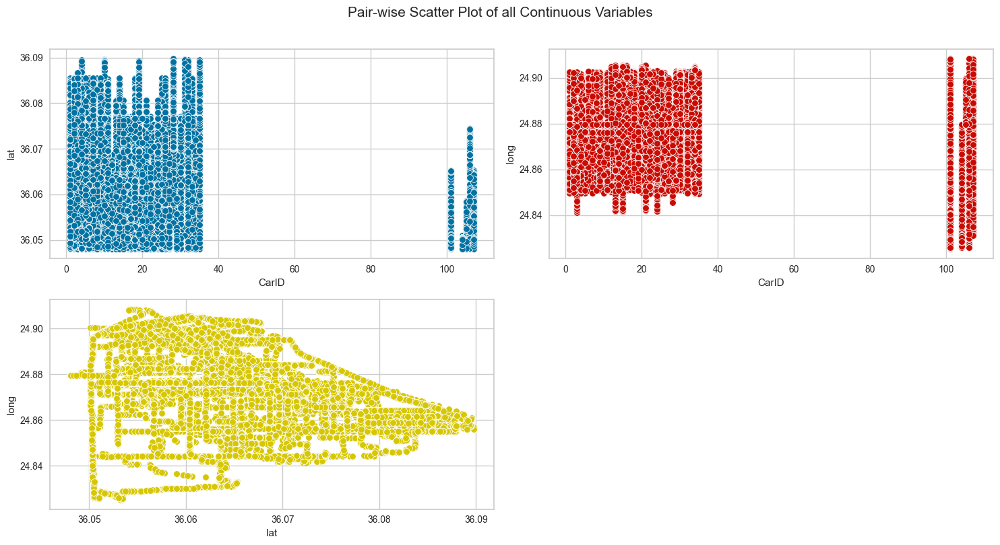

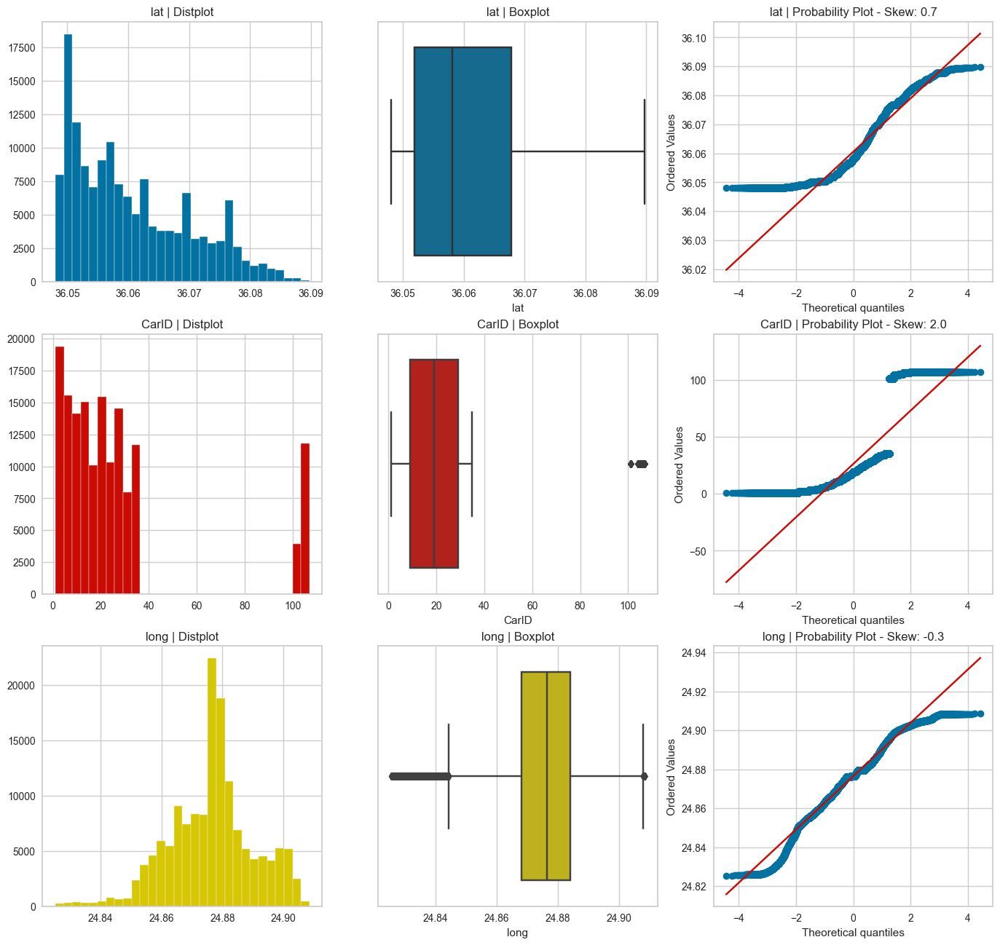

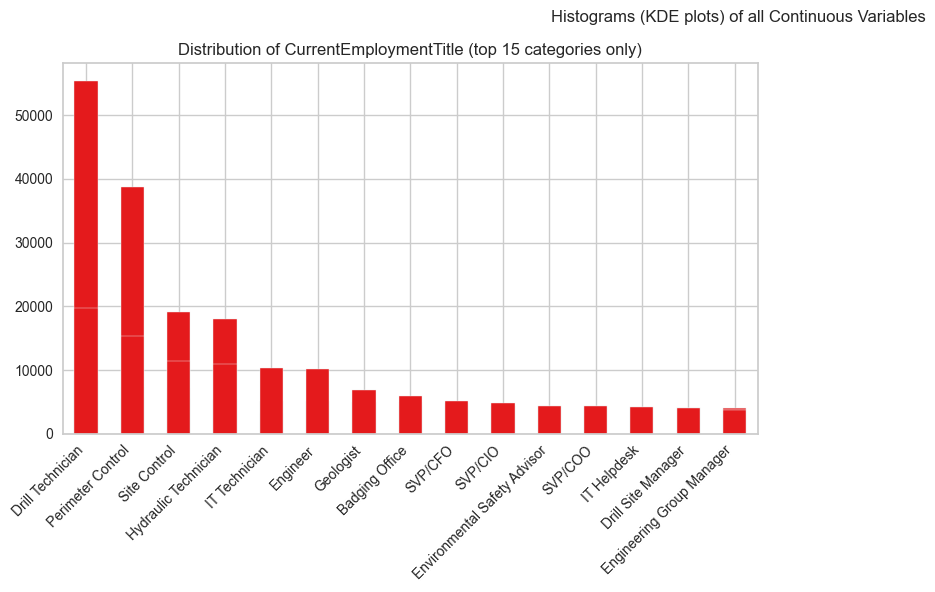

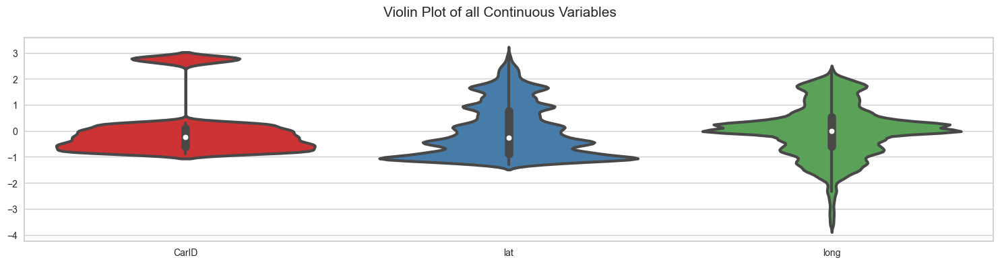

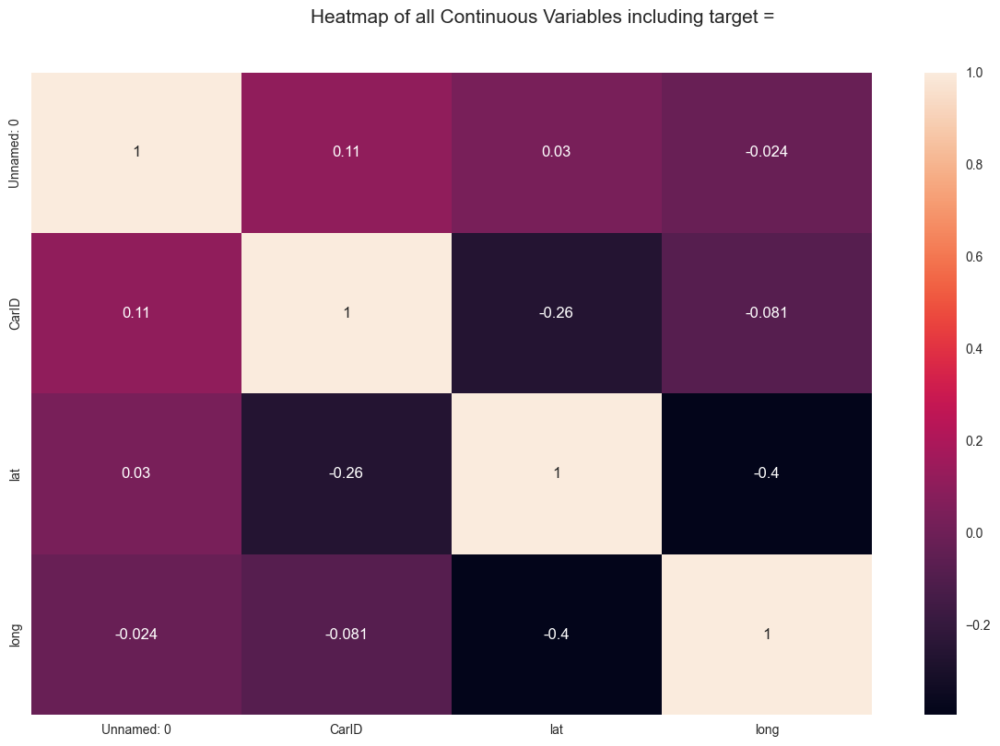

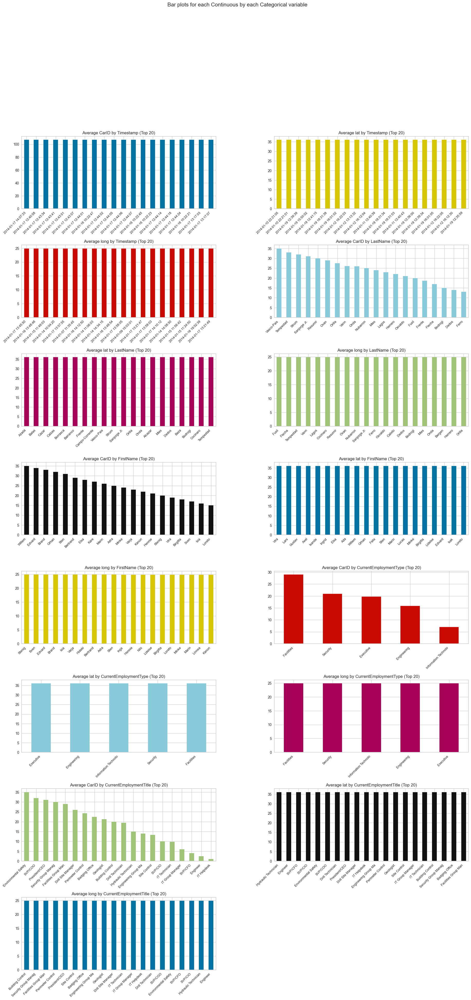

All Plots done
Time to run AutoViz = 5 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Unnamed: 0,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle
86035,86035,2014-01-07 13:39:37,35.0,36.056704,24.863585,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
150703,150703,2014-01-08 17:18:51,18.0,36.051935,24.880122,Frente,Birgitta,Engineering,Geologist
651348,651348,2014-01-18 12:26:09,10.0,36.068699,24.857113,Campo-Corrente,Ada,Executive,SVP/CIO
174295,174295,2014-01-09 07:53:00,3.0,36.068960,24.874725,Balas,Felix,Engineering,Engineer
341313,341313,2014-01-13 08:07:33,6.0,36.050949,24.879574,Bergen,Linnea,Information Technology,IT Group Manager
...,...,...,...,...,...,...,...,...,...
5660,5660,2014-01-06 07:43:19,101.0,36.050333,24.840265,NaN,NaN,NaN,NaN
216121,216121,2014-01-09 17:59:35,19.0,36.078048,24.862772,Frente,Vira,Engineering,Hydraulic Technician
658126,658126,2014-01-18 13:29:04,9.0,36.063625,24.883012,Calzas,Axel,Engineering,Drill Technician
3802,3802,2014-01-06 07:33:39,2.0,36.082721,24.852121,Azada,Lars,Engineering,Engineer


In [11]:
AV = AutoViz_Class()
AV.AutoViz("gps_df.csv")

Shape of your Data Set loaded: (1491, 6)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Unnamed: 0,1491,int64,0,0.000000,100.000000,0,possible ID column: drop
price,1342,float64,0,0.000000,90.006707,0,highly skewed: drop outliers or do box-cox transform
timestamp,1117,object,0,0.000000,74.916164,1,combine rare categories
FirstName,53,object,0,0.000000,3.554661,4,
LastName,47,object,0,0.000000,3.152247,5,
location,34,object,0,0.000000,2.280349,1,combine rare categories


    6 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0']


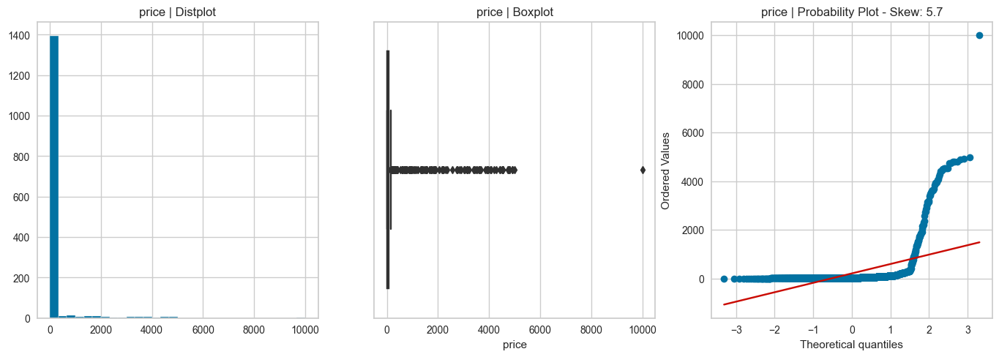

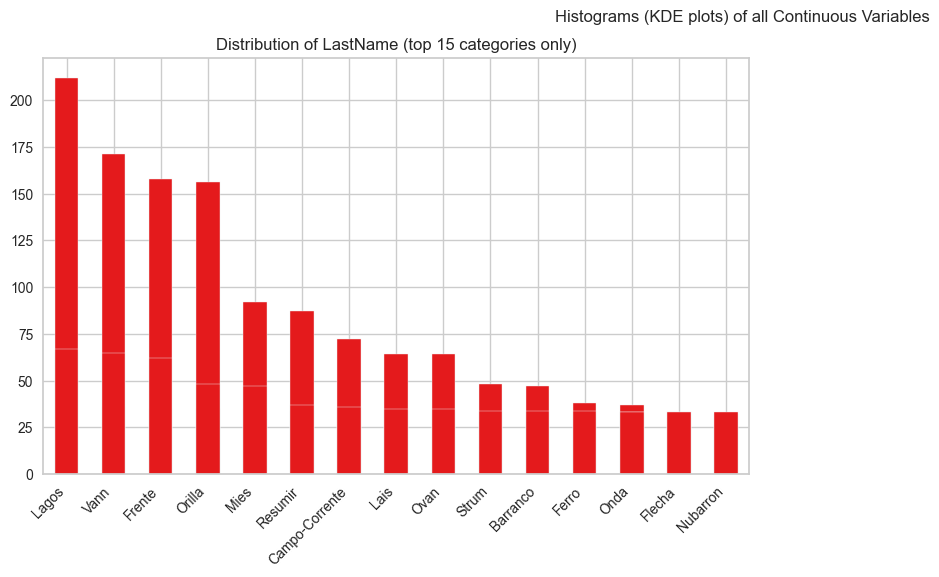

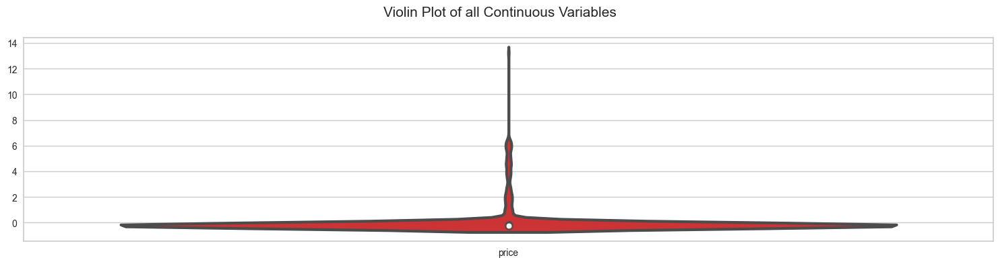

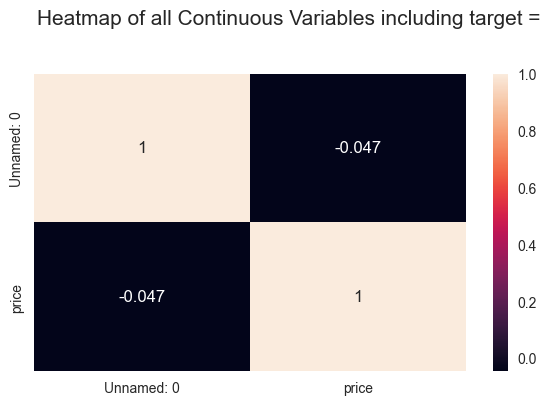

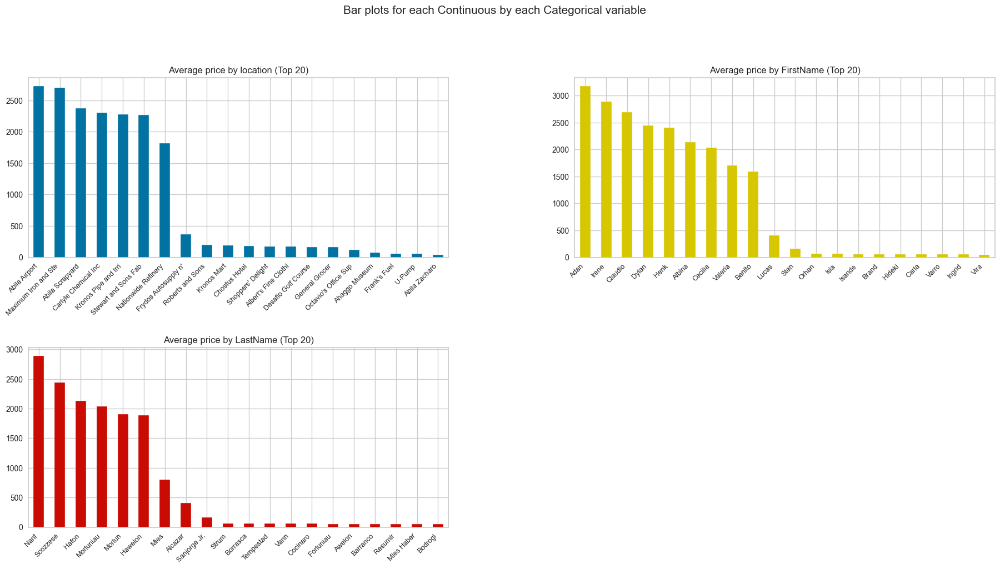

[nltk_data] Error loading popular: <urlopen error [Errno 8] nodename
[nltk_data]     nor servname provided, or not known>


Could not draw wordcloud plot for timestamp
All Plots done
Time to run AutoViz = 2 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Unnamed: 0,timestamp,location,price,FirstName,LastName
0,0,2014-01-06 07:28:00,Brew've Been Served,11.34,Edvard,Vann
1,1,2014-01-06 07:34:00,Hallowed Grounds,52.22,Hideki,Cocinaro
2,2,2014-01-06 07:35:00,Brew've Been Served,8.33,Stenig,Fusil
3,3,2014-01-06 07:36:00,Hallowed Grounds,16.72,Birgitta,Frente
4,4,2014-01-06 07:37:00,Brew've Been Served,4.24,Sven,Flecha
...,...,...,...,...,...,...
1486,1486,2014-01-19 20:16:00,Guy's Gyros,37.48,Brand,Tempestad
1487,1487,2014-01-19 20:22:00,Katerina’s Café,38.90,Birgitta,Frente
1488,1488,2014-01-19 20:25:00,Guy's Gyros,20.94,Loreto,Bodrogi
1489,1489,2014-01-19 20:30:00,Guy's Gyros,31.94,Minke,Mies


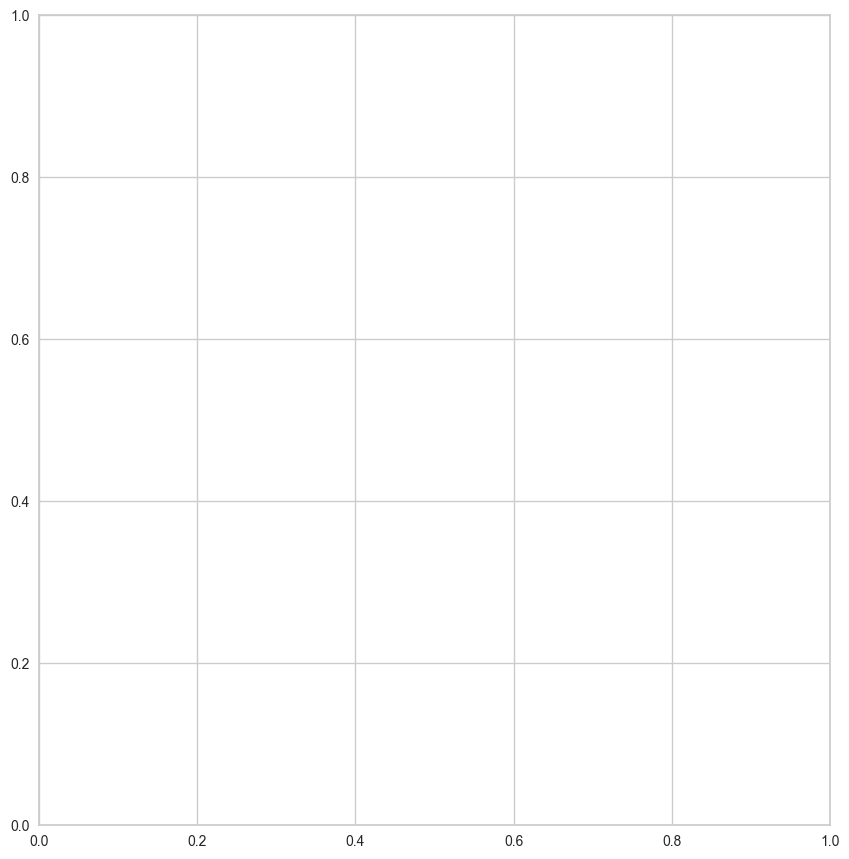

In [12]:
AV.AutoViz("credit_df.csv")

Shape of your Data Set loaded: (1393, 6)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Unnamed: 0,1393,int64,0,0.000000,100.000000,0,possible ID column: drop
price,1217,float64,0,0.000000,87.365398,0,skewed: cap or drop outliers
FirstName,53,object,0,0.000000,3.804738,3,
LastName,47,object,0,0.000000,3.374013,6,
location,33,object,0,0.000000,2.368988,1,combine rare categories
timestamp,14,object,0,0.000000,1.005025,43,


    6 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0']


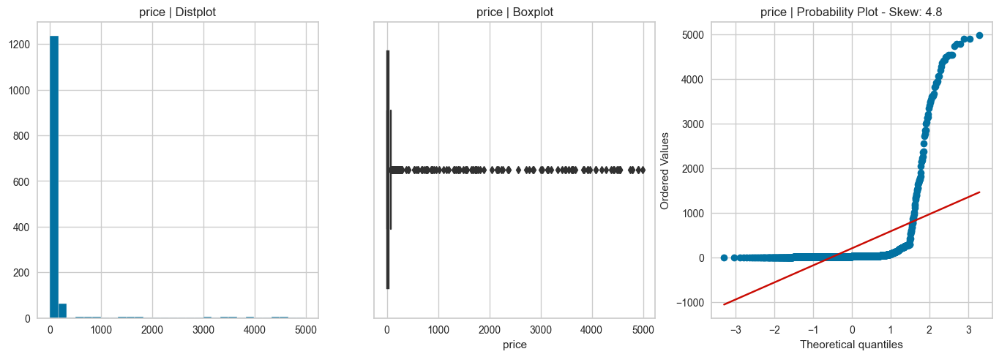

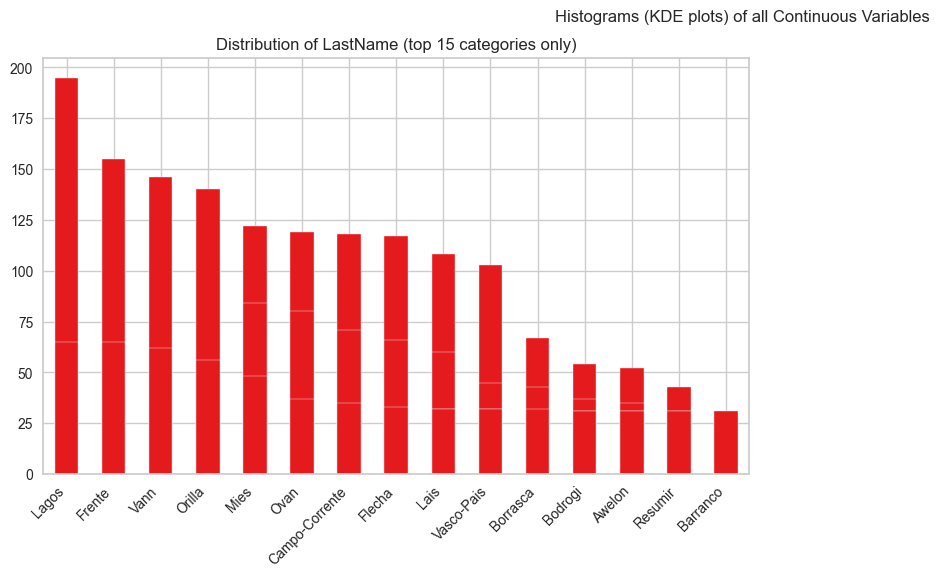

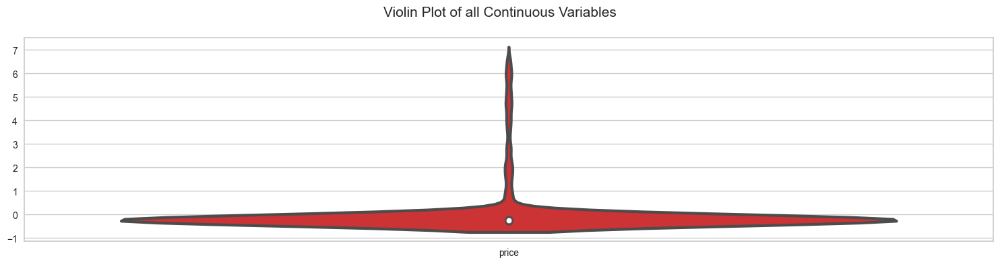

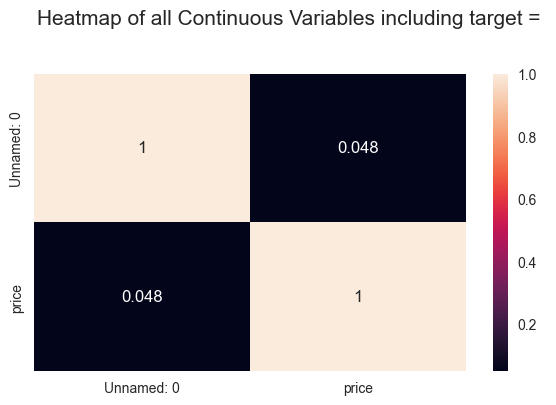

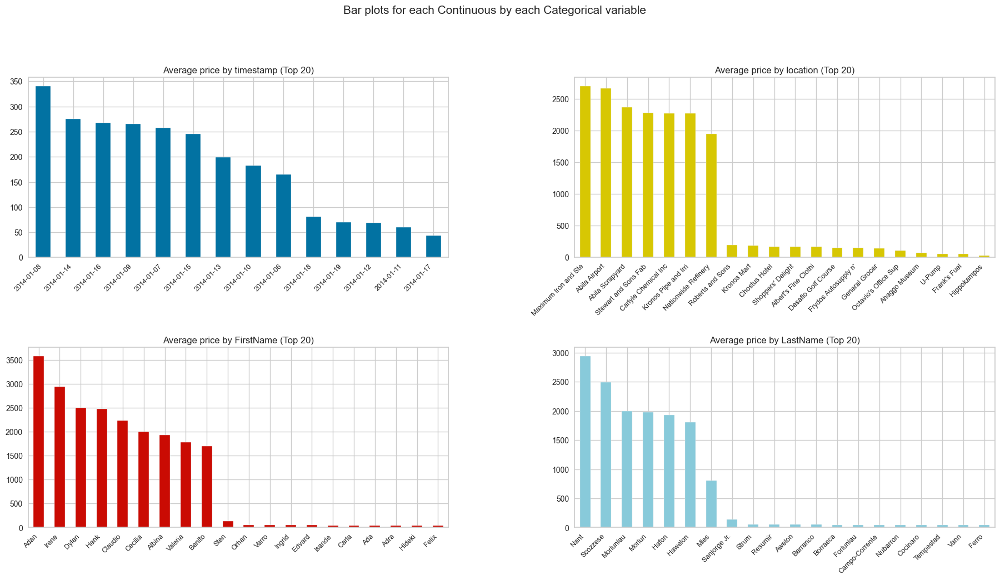

All Plots done
Time to run AutoViz = 1 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Unnamed: 0,timestamp,location,price,FirstName,LastName
0,0,2014-01-06,Brew've Been Served,4.17,Cornelia,Lais
1,1,2014-01-06,Brew've Been Served,9.60,Mat,Bramar
2,2,2014-01-06,Hallowed Grounds,16.53,Emile,Arpa
3,3,2014-01-06,Coffee Shack,11.51,Varro,Awelon
4,4,2014-01-06,Hallowed Grounds,12.93,Rachel,Pantanal
...,...,...,...,...,...,...
1388,1388,2014-01-19,Katerina’s Café,70.22,Edvard,Vann
1389,1389,2014-01-19,Guy's Gyros,18.08,Isia,Vann
1390,1390,2014-01-19,Katerina’s Café,35.01,Isia,Vann
1391,1391,2014-01-19,Desafio Golf Course,110.02,Willem,Vasco-Pais


In [13]:
AV.AutoViz("loyalty_df.csv")

## Prompt 1: Describe common daily routines for GAStech employees.
What does a day in the life of a typical GAStech employee look like?

In [17]:
car_gps_df['fullName'] = car_gps_df['FirstName'] + " " + car_gps_df['LastName']
car_gps_df.head()

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,Date,fullName
0,2014-01-06 06:28:01,35.0,36.076225,24.874689,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
1,2014-01-06 06:28:01,35.0,36.076220,24.874596,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
2,2014-01-06 06:28:03,35.0,36.076211,24.874443,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
3,2014-01-06 06:28:05,35.0,36.076217,24.874253,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
4,2014-01-06 06:28:06,35.0,36.076214,24.874167,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais


In [19]:
car_gps_df['Date'] = car_gps_df['Timestamp'].map(lambda x: x.date())
car_gps_df.sort_values(by='Timestamp', inplace=True)
car_gps_df.head()

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,Date,fullName
0,2014-01-06 06:28:01,35.0,36.076225,24.874689,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
1,2014-01-06 06:28:01,35.0,36.076220,24.874596,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
2,2014-01-06 06:28:03,35.0,36.076211,24.874443,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
3,2014-01-06 06:28:05,35.0,36.076217,24.874253,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais
4,2014-01-06 06:28:06,35.0,36.076214,24.874167,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,2014-01-06,Willem Vasco-Pais


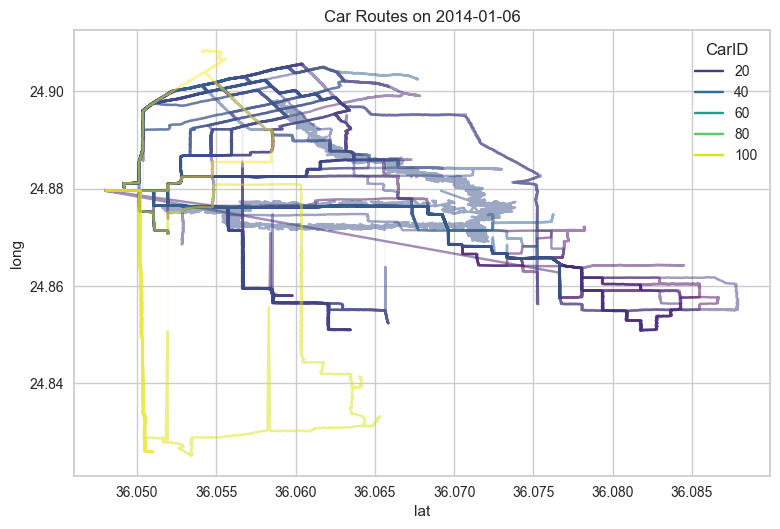

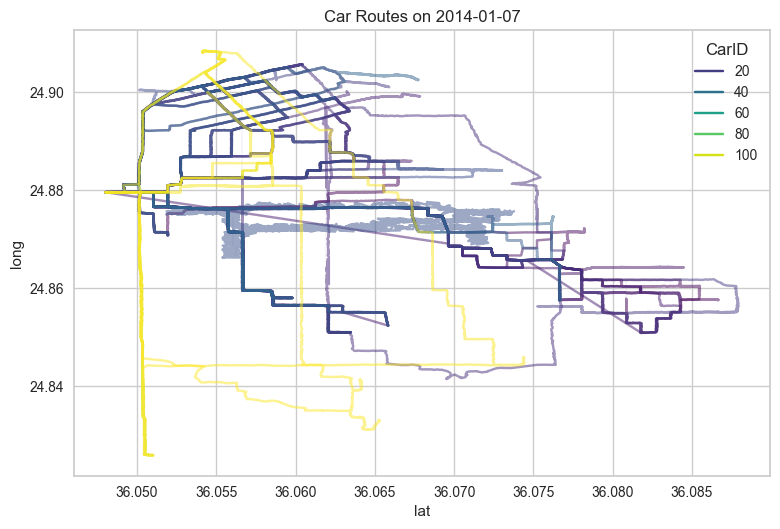

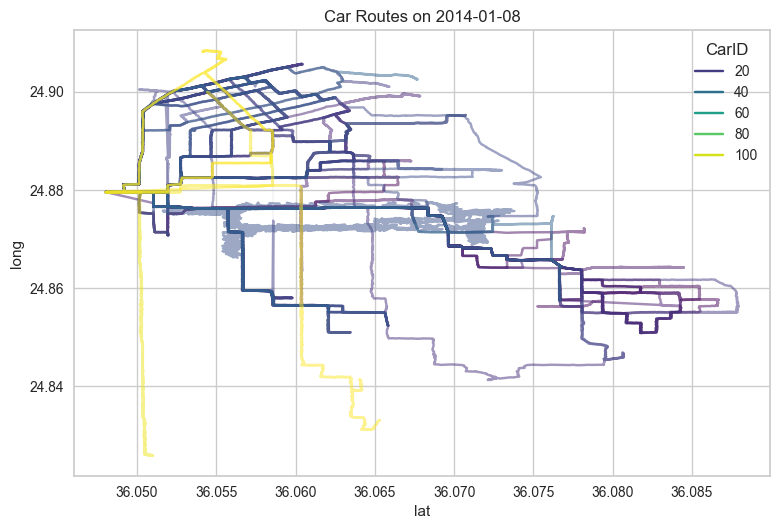

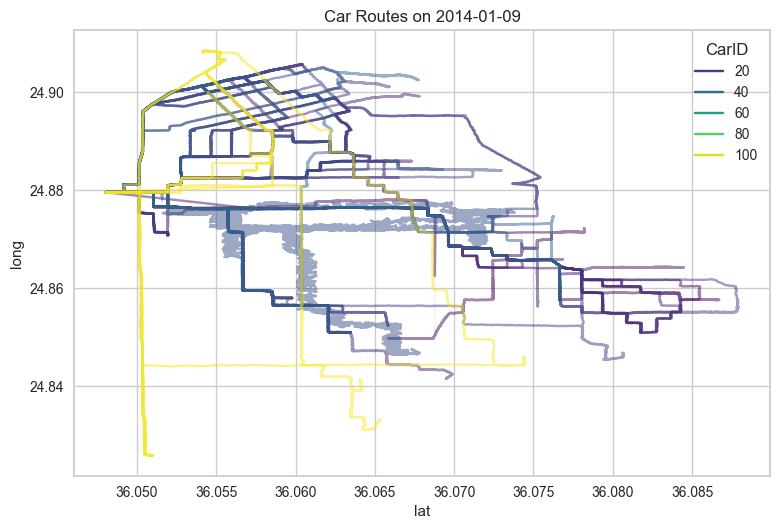

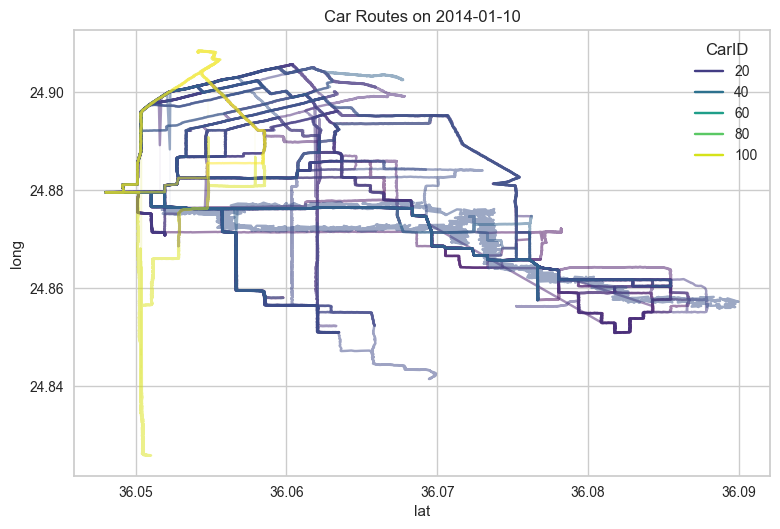

...

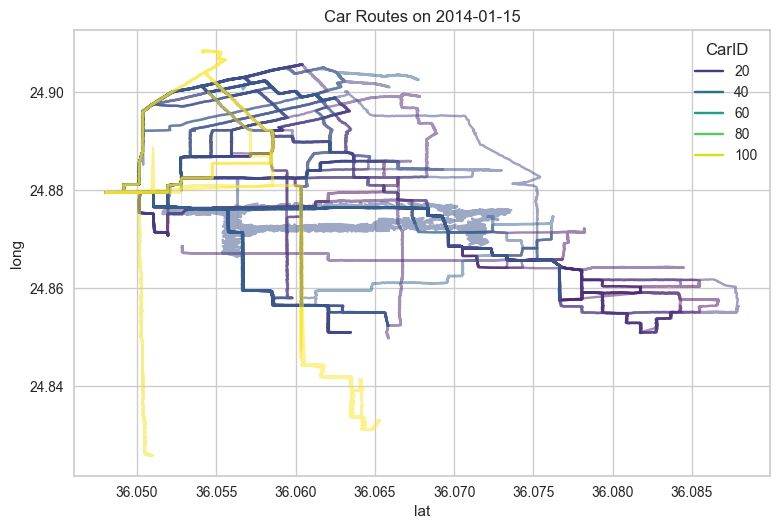

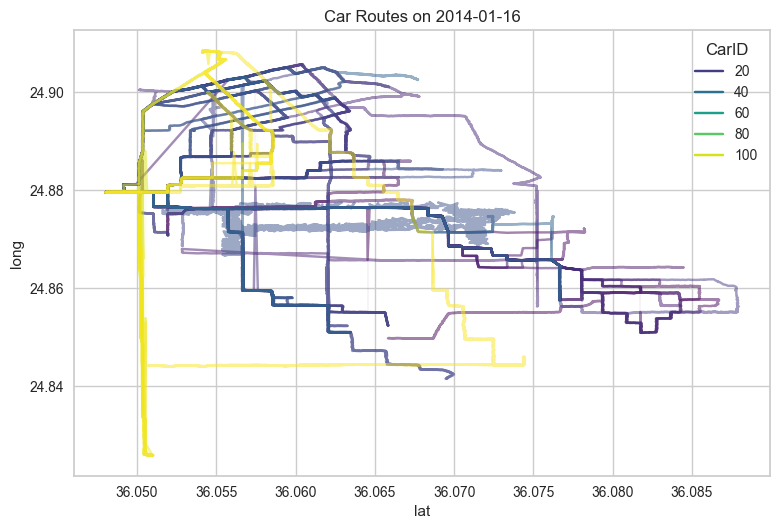

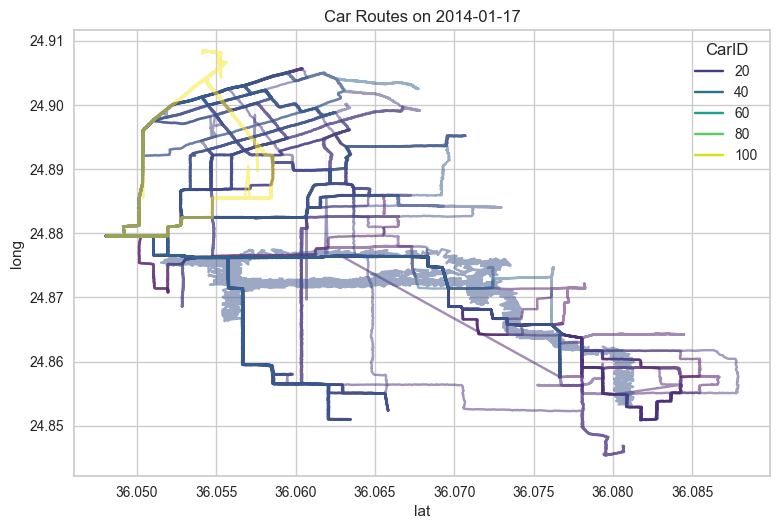

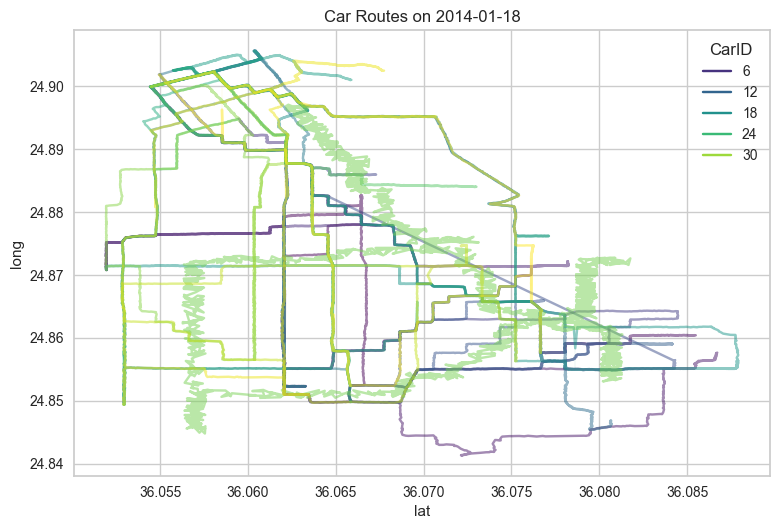

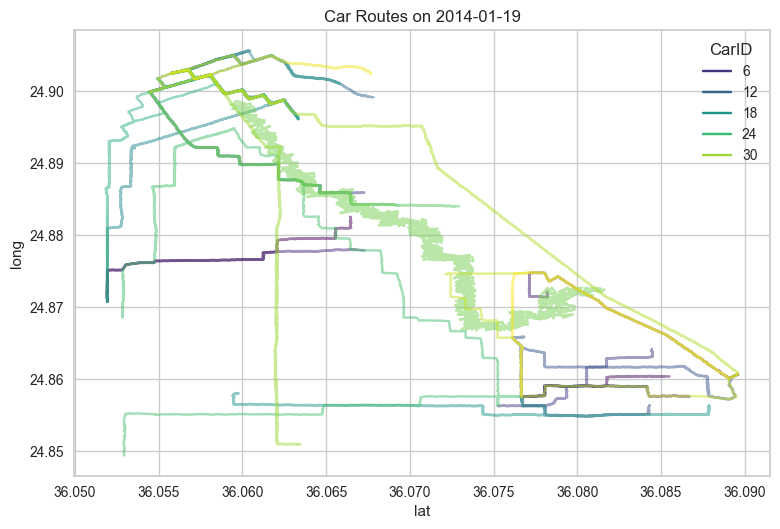

In [25]:
dates = car_gps_df['Date'].unique()
for i in range(14):
    plt.figure()
    sns.lineplot(x=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['lat'], y=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['long'], hue=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['CarID'], palette='viridis', sort=False, alpha=0.5)
    plt.title("Car Routes on " + str(dates[i]))
    plt.show()

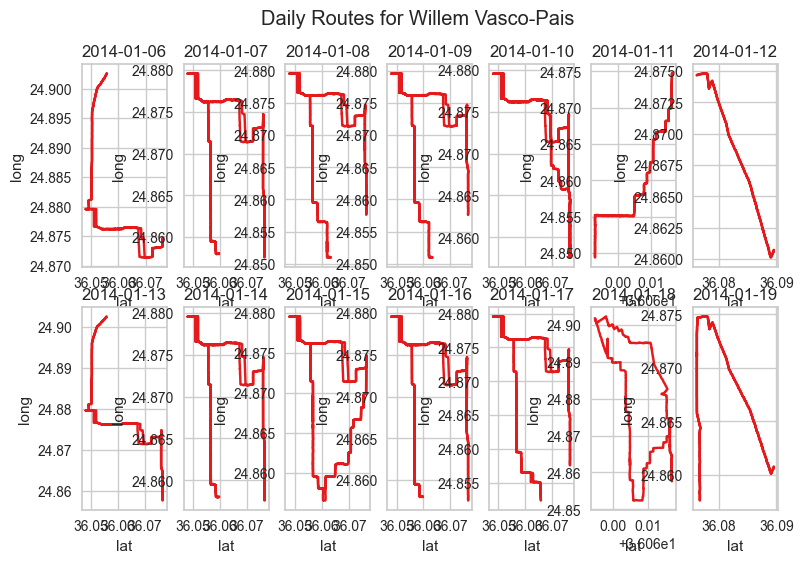

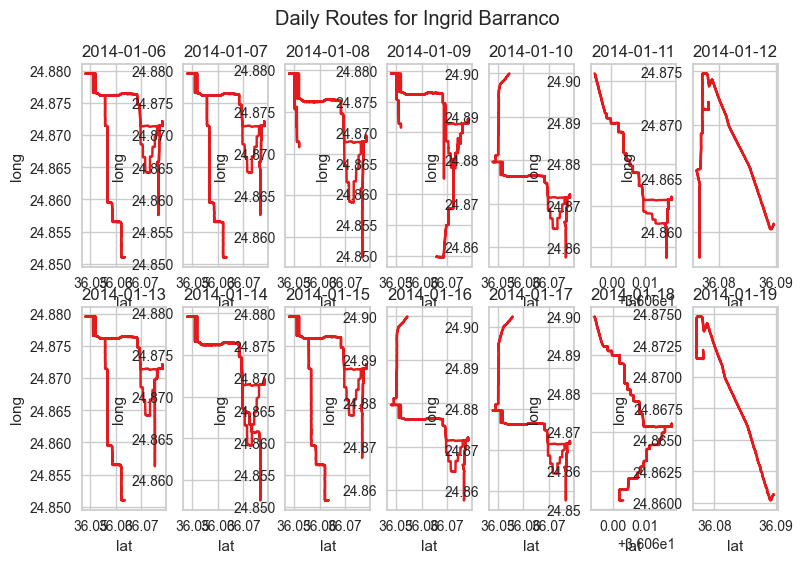

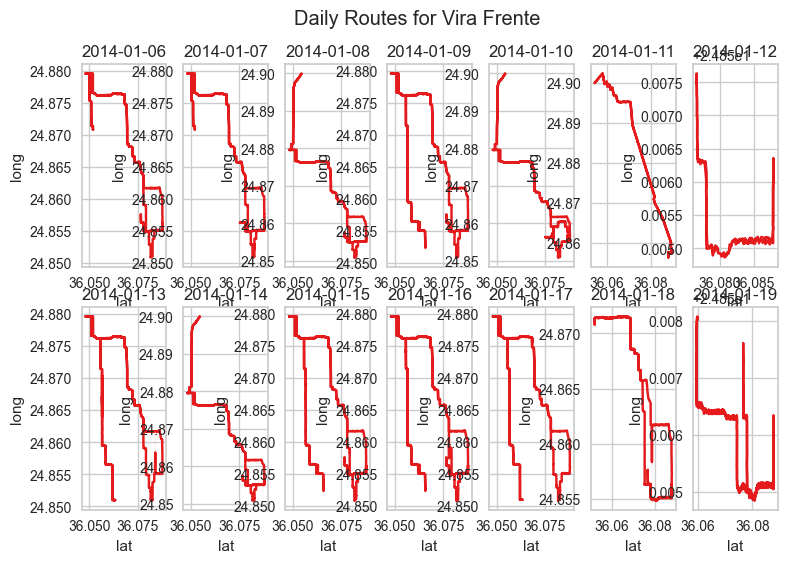

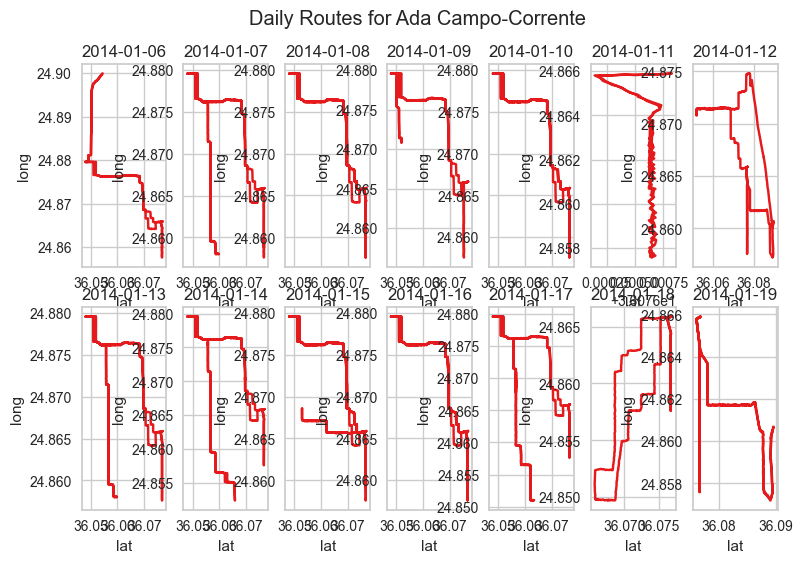

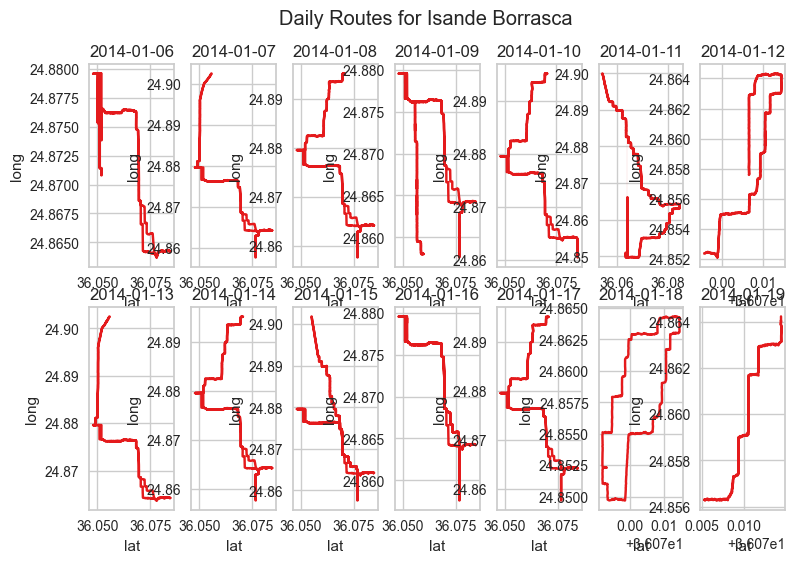

...

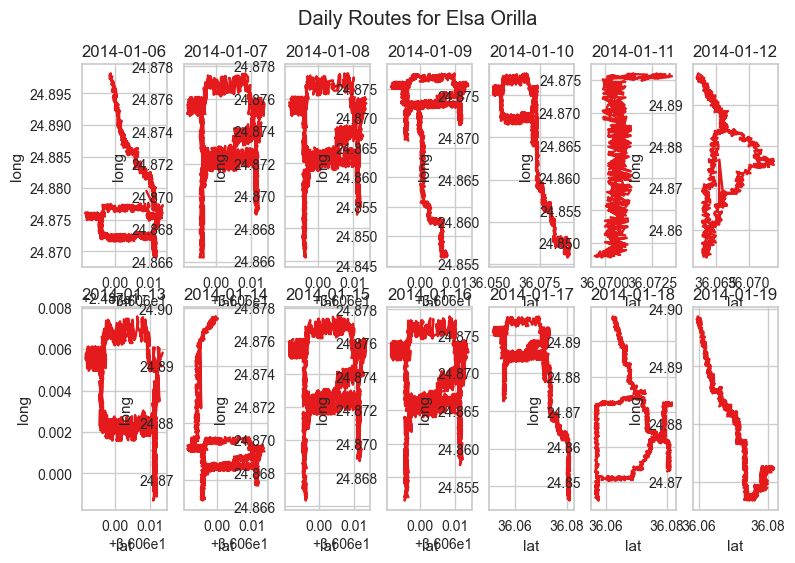

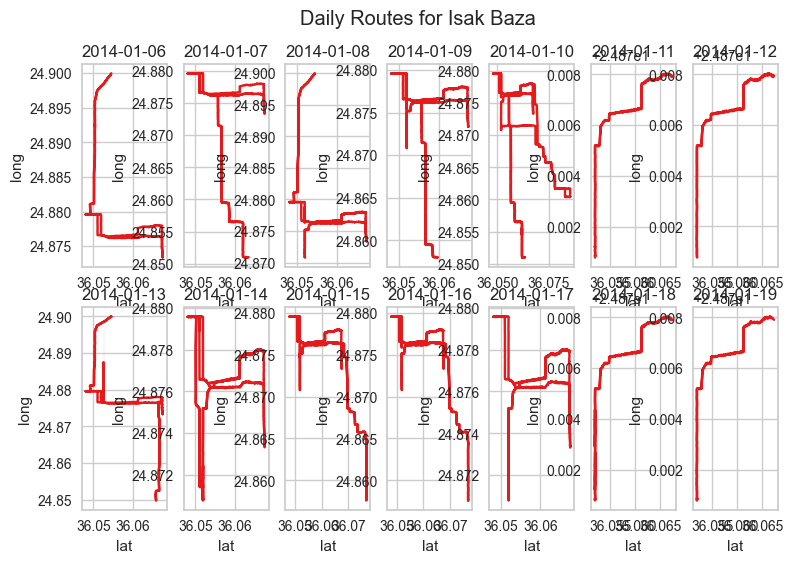

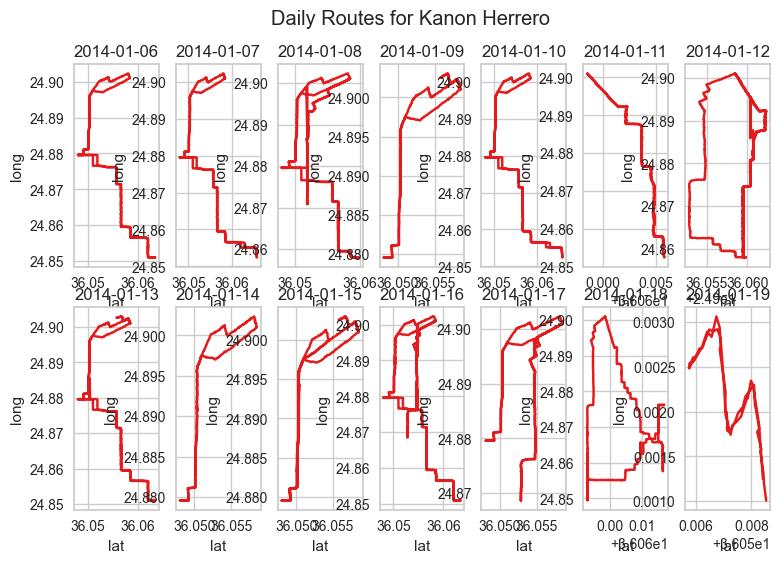

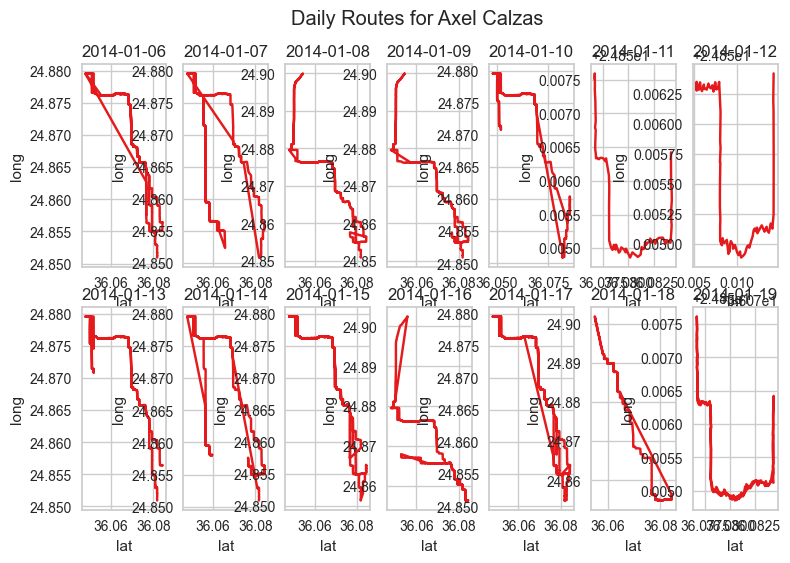

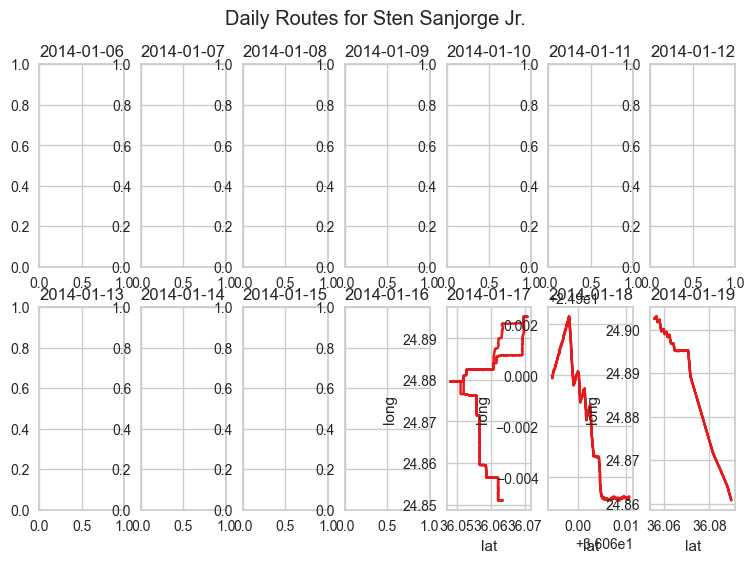

In [46]:
emps = car_gps_df[car_gps_df['fullName'].notna()]['fullName'].unique()

for emp in emps:
    emp_dat = car_gps_df[car_gps_df['fullName'] == emp]
    fig = plt.figure()
    for i in range(1, 15):
        ax = fig.add_subplot(2, 7, i)
        sns.lineplot(x=emp_dat[emp_dat['Date'] == pd.to_datetime(dates[i - 1])]['lat'], y=emp_dat[emp_dat['Date'] == pd.to_datetime(dates[i - 1])]['long'], sort=False, ax=ax)
        ax.set_title(dates[i - 1])
    fig.suptitle("Daily Routes for " + emp)
    plt.show()

In [60]:
grouped = loyalty_data.groupby(by=["FirstName", "LastName", "location"]).count()

In [64]:
grouped[grouped['timestamp'] > 0]

timestamp  price
FirstName LastName       location                                
Ada       Campo-Corrente Abila Zacharo                   1      1
                         Albert's Fine Clothing          1      1
                         Brewed Awakenings               9      9
                         Desafio Golf Course             2      2
                         Gelatogalore                    2      2
...                                                    ...    ...
Willem    Vasco-Pais     General Grocer                  1      1
                         Guy's Gyros                     2      2
                         Hippokampos                    10     10
                         Jack's Magical Beans            8      8
                         Kalami Kafenion                 2      2

[424 rows x 2 columns]

In [67]:
credit_data.sort_values(by=["FirstName", "LastName", 'timestamp'])

,timestamp,location,price,FirstName,LastName
42,2014-01-06 12:00:00,Brewed Awakenings,4.35,Ada,Campo-Corrente
49,2014-01-06 12:56:00,Katerina’s Café,13.68,Ada,Campo-Corrente
127,2014-01-06 21:52:00,Hippokampos,20.61,Ada,Campo-Corrente
169,2014-01-07 12:00:00,Brewed Awakenings,6.72,Ada,Campo-Corrente
180,2014-01-07 13:20:00,Gelatogalore,35.06,Ada,Campo-Corrente
...,...,...,...,...,...
1382,2014-01-18 13:28:00,Kalami Kafenion,38.91,Willem,Vasco-Pais
1403,2014-01-18 15:53:00,Frydos Autosupply n' More,120.67,Willem,Vasco-Pais
1421,2014-01-18 19:36:00,Hippokampos,53.21,Willem,Vasco-Pais
1460,2014-01-19 15:15:00,Desafio Golf Course,110.02,Willem,Vasco-Pais
